In [1]:

%matplotlib inline
import sys
sys.path.append('/home/idies/workspace/Storage/fzohrabi/persistent/hrpo-pipeline/')
import plateSolve
from astropy.nddata import CCDData
import ccdproc as ccdp
import os
from pathlib import Path
import warnings
warnings.simplefilter("ignore")
#Import all the modules we'll need

from astropy import __version__ as apversion
from astropy.nddata import CCDData
import numpy as np
import scipy.ndimage as ndi
import matplotlib.pyplot as plt
from astropy.visualization import hist,ZScaleInterval,simple_norm
from astropy.stats import histogram
from astropy.coordinates import ICRS
import scipy.stats as sps
import photutils as phot
from astropy.io import fits
from astropy.wcs import WCS
import matplotlib.pyplot as plt
import ccdproc as ccdp
import astropy.units as u
from photutils.aperture import CircularAperture
from uncertainties import ufloat

from pathlib import Path
import warnings
warnings.simplefilter("ignore")
import os

import sys
sys.path.append('/home/idies/workspace/Storage/fzohrabi/persistent/hrpo-pipeline')
import aperturePhot as ap
import plateSolve

%matplotlib inline
print(apversion)
os.getcwd()

import astropy.wcs as wcs
datadir = '/home/idies/workspace/Temporary/fzohrabi/scratch/SN/SN2022xzm'
path = Path(datadir)
os.chdir(path)

JD = [ 2459880.5822685184,2459887.5607986110, 2459894.5725231483, 2459901.6048726854, 2459912.51525816]  #10/27,11/03, 11/10, 11/17,11/28
JD1103 = JD[1] - 2450000
JD1110 = JD[2]-2450000
JD1027= JD[0]-2450000
JD1128= JD[4]-2450000


5.0


In [2]:
#1027
imname = 'SN2022xzm_1027-002R.wcs.fit'
im_R = CCDData.read(imname)
#print(imR.header)
#ap.showimage(imR)

sources,bgplane = ap.findStars(im_R,bgorder=1,daofwhm=4.0,daothresh=5.0,verbose=1)
#ap.showimage(bgplane)
print("Background subtracted image")
bgsubimR = imR.data-bgplane
#ap.showimage(bgsubimR)



['id', 'xcentroid', 'ycentroid', 'sharpness', 'roundness1', 'roundness2', 'npix', 'sky', 'peak', 'flux', 'mag']
Background subtracted image


In [4]:
#1027
#id is 10 for SN
xSN = 531.65488
ySN = 477.82274
#id is 14 for flip
xgal = 507.87768
ygal = 457.85884

sources[10]['xcentroid'] = xSN
sources[10]['ycentroid'] = ySN
sources[14]['xcentroid'] = xgal
sources[14]['ycentroid'] = ygal

<class 'astropy.nddata.ccddata.CCDData'>
<class 'astropy.nddata.ccddata.CCDData'>
<class 'astropy.nddata.ccddata.CCDData'>
702.6408643195277 25.330943008325217
600.9090173170869 831.4077416492057
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22']


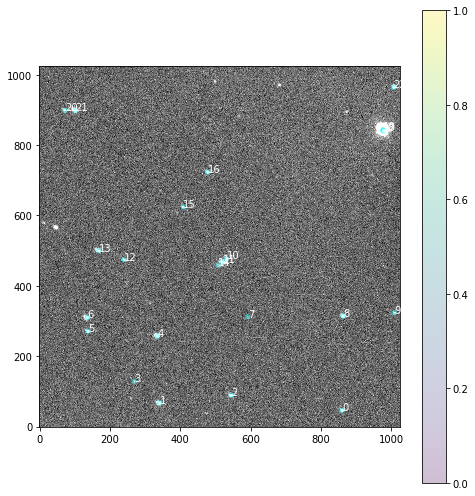

In [5]:
rap,mag,err,apers = ap.growthCurve(im_R,sources,gain=1.6,readnoise=17)
positions = np.transpose((sources['xcentroid'], sources['ycentroid']))
apers_set = CircularAperture(positions, r=5.0)
ap.showimage(imR,apertures=apers_set,stars=sources, starid='label')


Star magnitudes at reference aperture radius (8.0):
10 -5.880285358734184
14 -5.1246277336119785
4 -7.876534027390946
5 -6.504209081020868
6 -7.432729285977987


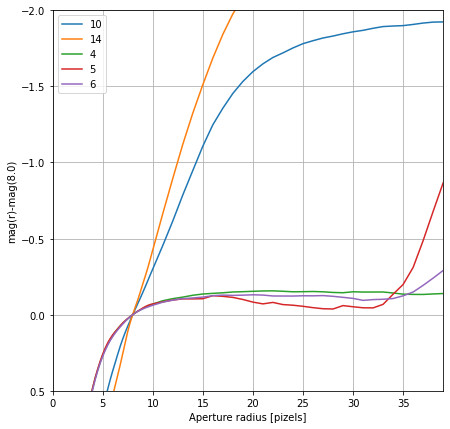

Optimum aperture:
10 20.0
14 23.0
4 5.25
5 4.75
6 5.0


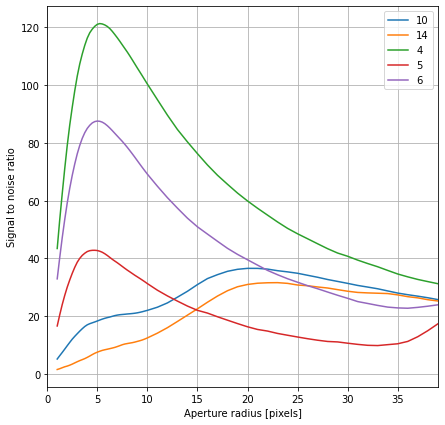

In [6]:
ap.plotGrowth(rap,mag,err,plotstars = [10,14,4,5,6],figsize=(7,7), ylim = [0.5, -2])
ap.plotSNR(rap,mag,err,plotstars=[10,14,4,5,6],figsize=(7,7))

In [7]:
useForAppCorr = [4]
stoppingApertureRadius = 20.0
optaplist = [4]
imag,ierr,isys,apCorr = ap.apertureCorrection(rap,mag,err,optap=optaplist,
                                              stoppingAperture=stoppingApertureRadius,
                                              stars=useForAppCorr)

Using optimum aperture radius for star 4
Optimum aperture radius 5.25
stoppingidx 46 20.0
Systematic error from r>stopping aperture
Aperture correction: -0.38197017636019126 +/- 0.0073742992305803915


In [8]:
from uncertainties import ufloat
f2 = open('/home/idies/workspace/Temporary/fzohrabi/scratch/SN/SN2022xzm/Data/Phot_xzm_R.txt','a')
SN = ufloat(imag[10], ierr[10])
galbg = ufloat(imag[14], ierr[14])
SNinsmag = SN - galbg
print(SN,galbg)
print(SNinsmag)
#f2.write( "JD SN SNerr Ref Referr \n"  )
f2.write('%7.5f %s %5.3f %5.3f \n' % (JD1027,str(SNinsmag), imag[4],ierr[4]))

-5.70+/-0.05 -4.74+/-0.12
-0.97+/-0.13


38

708.2795398852248 25.441888008849862
628.7383114334611 849.444052539081
['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22']


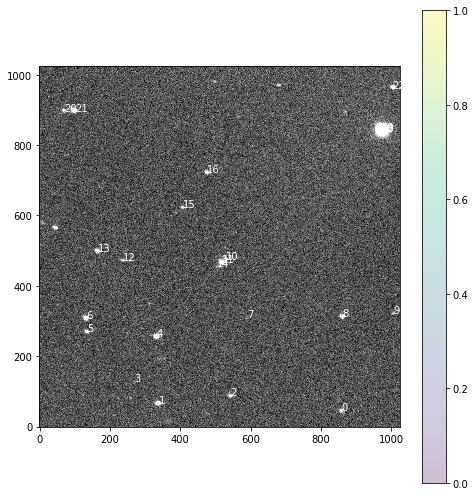

<class 'astropy.nddata.ccddata.CCDData'>
<class 'astropy.nddata.ccddata.CCDData'>
<class 'astropy.nddata.ccddata.CCDData'>
Specified optimum aperture radius = 4.5
Optimum aperture radius 4.5
stoppingidx 46 20.0
Systematic error from r>stopping aperture
Aperture correction: -0.6420971623973895 +/- 0.0037278217343238796


In [25]:
im_V = CCDData.read('SN2022xzm_1027-001R.wcs.fit')
hdu_R = fits.open('SN2022xzm_1027-002R.wcs.fit') 
hdu_V = fits.open('SN2022xzm_1027-001R.wcs.fit')


wcs_V = wcs.WCS(hdu_V[0].header)
wcs_R = wcs.WCS(hdu_R[0].header)

#1027
#id is 10 for SN
xSN = 531.65488
ySN = 477.82274
#id is 14 for flip
xgal = 507.87768
ygal = 457.85884

sources[10]['xcentroid'] = xSN
sources[10]['ycentroid'] = ySN
sources[14]['xcentroid'] = xgal
sources[14]['ycentroid'] = ygal

R_xy = np.transpose((sources['xcentroid'],sources['ycentroid']))
ra_dec = wcs_R.all_pix2world(R_xy,1)
V_xy = wcs_V.all_world2pix(ra_dec,1)

ap.showimage(im_V,stars=V_xy,starid='label' )

rapVR,magVR,errVR,apersVR = ap.growthCurve(im_V,V_xy,gain=1.6,readnoise=17)

imagVR,ierrVR,isysVR,apCorrVR = ap.apertureCorrection(rapVR,magVR,errVR,optap=4.5,
                                              stoppingAperture=stoppingApertureRadius,
                                              stars=useForAppCorr)

In [28]:
# R mag 

f2 = open('/home/idies/workspace/Temporary/fzohrabi/scratch/SN/SN2022xzm/Data/Phot_xzm_R.txt','a')
SNVR = ufloat(imagVR[10], ierrVR[10])
galbgVR = ufloat(imagVR[14], ierrVR[14])
SNinsmagVR = SNVR - galbgVR
print(SNVR,galbgVR)
print(SNinsmagVR)

#f3.write( "JD SN SNerr Ref Referr \n")
f2.write('%7.5f %s %5.3f %5.3f \n' % (JD1027,str(SNinsmagVR), imagVR[4],ierrVR[4]))

-5.64+/-0.06 -4.15+/-0.22
-1.49+/-0.22


38

In [24]:
#Vmag

f3 = open('/home/idies/workspace/Temporary/fzohrabi/scratch/SN/SN2022xzm/Data/Phot_xzm_V.txt','a')
SNVR = ufloat(imagVR[10], ierrVR[10])
galbgVR = ufloat(imagVR[14], ierrVR[14])
SNinsmagVR = SNVR - galbgVR
print(SNVR,galbgVR)
print(SNinsmagVR)

#f3.write( "JD SN SNerr Ref Referr \n")
f3.write('%7.5f %s %5.3f %5.3f \n' % (JD1027,str(SNinsmagVR), imagVR[4],ierrVR[4]))

-5.12+/-0.08 -3.52+/-0.32
-1.61+/-0.33


38

In [22]:
print(JD1110)

9894.572523148265
